In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [2]:
df = pd.read_csv('./Data/Dibya/PM2_5_Data_India.csv')
df = df[['Datetime', 'CO', 'NO', 'NO2', 'O3', 'SO2', 'PM2.5', 'PM10', 'NH3','Benzene','Toluene','AQI','AQI_Bucket']]
df.head()

,Datetime,CO,NO,NO2,O3,SO2,PM2.5,PM10,NH3,Benzene,Toluene,AQI,AQI_Bucket
0,2017-11-24 17:00:00,0.1,2.35,30.80,126.40,11.85,60.50,98.00,8.50,0.1,6.10,NaN,NaN
1,2017-11-24 18:00:00,0.1,2.70,24.20,117.12,13.17,65.50,111.25,9.77,0.1,6.25,NaN,NaN
2,2017-11-24 19:00:00,0.1,2.10,25.18,98.98,12.08,80.00,132.00,12.02,0.2,5.98,NaN,NaN
3,2017-11-24 20:00:00,0.1,1.95,16.25,112.20,10.47,81.50,133.25,11.58,0.2,6.72,NaN,NaN
4,2017-11-24 21:00:00,0.1,1.43,17.48,106.35,9.12,75.25,116.00,12.03,0.2,5.75,NaN,NaN


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2589083 entries, 0 to 2589082
Data columns (total 13 columns):
 #   Column      Dtype  
---  ------      -----  
 0   Datetime    object 
 1   CO          float64
 2   NO          float64
 3   NO2         float64
 4   O3          float64
 5   SO2         float64
 6   PM2.5       float64
 7   PM10        float64
 8   NH3         float64
 9   Benzene     float64
 10  Toluene     float64
 11  AQI         float64
 12  AQI_Bucket  object 
dtypes: float64(11), object(2)
memory usage: 256.8+ MB


In [4]:
df.count()
#no-null count

Datetime      2589083
CO            2089781
NO            2035372
NO2           2060110
O3            1863110
SO2           1846346
PM2.5         1941394
PM10          1469831
NH3           1352465
Benzene       1727504
Toluene       1546717
AQI           2018893
AQI_Bucket    2018893
dtype: int64

In [5]:
df.describe()

,CO,NO,NO2,O3,SO2,PM2.5,PM10,NH3,Benzene,Toluene,AQI
count,2.089781e+06,2.035372e+06,2.060110e+06,1.863110e+06,1.846346e+06,1.941394e+06,1.469831e+06,1.352465e+06,1.727504e+06,1.546717e+06,2.018893e+06
mean,1.502366e+00,2.278825e+01,3.523689e+01,3.806408e+01,1.211602e+01,8.086481e+01,1.584839e+02,2.870856e+01,3.305493e+00,1.490266e+01,1.801730e+02
std,6.292445e+00,4.846146e+01,3.497508e+01,4.710653e+01,1.467385e+01,8.947618e+01,1.397883e+02,2.753244e+01,1.214053e+01,3.329729e+01,1.404095e+02
min,0.000000e+00,1.000000e-02,1.000000e-02,1.000000e-02,1.000000e-02,1.000000e-02,1.000000e-02,1.000000e-02,0.000000e+00,0.000000e+00,5.000000e+00
25%,4.100000e-01,3.050000e+00,1.310000e+01,1.102000e+01,4.250000e+00,2.816000e+01,6.400000e+01,1.123000e+01,8.000000e-02,3.400000e-01,8.400000e+01
50%,8.000000e-01,7.150000e+00,2.479000e+01,2.475000e+01,8.250000e+00,5.259000e+01,1.162500e+02,2.235000e+01,9.600000e-01,3.400000e+00,1.310000e+02
75%,1.380000e+00,1.858000e+01,4.548000e+01,4.953000e+01,1.453000e+01,9.774000e+01,2.040000e+02,3.778000e+01,3.230000e+00,1.510000e+01,2.590000e+02
max,4.985700e+02,5.000000e+02,4.999900e+02,9.970000e+02,1.999600e+02,1.000000e+03,1.000000e+03,4.999700e+02,4.980700e+02,4.999900e+02,3.133000e+03


In [3]:
df.rename(columns = {'CO':'Carbon Monoxide,μg/m3','NO':'Nitrogen Oxide,μg/m3','NO2':'Nitrogen Dioxide,μg/m3','O3':'Ozone,μg/m3',
          'SO2':'Sulphur Dioxide,μg/m3','PM2.5':'PM2.5,μg/m3','PM10':'PM10,μg/m3','NH3':'Ammonia,μg/m3','Benzene':'Benzene,μg/m3','Toluene':'Toluene,μg/m3'},inplace = True)

In [4]:
df.head(5)

,Datetime,"Carbon Monoxide,μg/m3","Nitrogen Oxide,μg/m3","Nitrogen Dioxide,μg/m3","Ozone,μg/m3","Sulphur Dioxide,μg/m3","PM2.5,μg/m3","PM10,μg/m3","Ammonia,μg/m3","Benzene,μg/m3","Toluene,μg/m3",AQI,AQI_Bucket
0,2017-11-24 17:00:00,0.1,2.35,30.80,126.40,11.85,60.50,98.00,8.50,0.1,6.10,NaN,NaN
1,2017-11-24 18:00:00,0.1,2.70,24.20,117.12,13.17,65.50,111.25,9.77,0.1,6.25,NaN,NaN
2,2017-11-24 19:00:00,0.1,2.10,25.18,98.98,12.08,80.00,132.00,12.02,0.2,5.98,NaN,NaN
3,2017-11-24 20:00:00,0.1,1.95,16.25,112.20,10.47,81.50,133.25,11.58,0.2,6.72,NaN,NaN
4,2017-11-24 21:00:00,0.1,1.43,17.48,106.35,9.12,75.25,116.00,12.03,0.2,5.75,NaN,NaN


In [7]:
df.isnull().sum()

Datetime                        0
Carbon Monoxide,μg/m3      499302
Nitrogen Oxide,μg/m3       553711
Nitrogen Dioxide,μg/m3     528973
Ozone,μg/m3                725973
Sulphur Dioxide,μg/m3      742737
PM2.5,μg/m3                647689
PM10,μg/m3                1119252
Ammonia,μg/m3             1236618
Benzene,μg/m3              861579
Toluene,μg/m3             1042366
AQI                        570190
AQI_Bucket                 570190
dtype: int64

In [5]:
# Fill missing values in numeric columns with their median
numeric_cols = df.select_dtypes(include=['number']).columns
df[numeric_cols] = df[numeric_cols].fillna(df[numeric_cols].median())
df['Datetime'] = df['Datetime'].interpolate(method='time')# for time series data

print(df.isnull().sum())

Datetime                       0
Carbon Monoxide,μg/m3          0
Nitrogen Oxide,μg/m3           0
Nitrogen Dioxide,μg/m3         0
Ozone,μg/m3                    0
Sulphur Dioxide,μg/m3          0
PM2.5,μg/m3                    0
PM10,μg/m3                     0
Ammonia,μg/m3                  0
Benzene,μg/m3                  0
Toluene,μg/m3                  0
AQI                            0
AQI_Bucket                570190
dtype: int64


In [6]:
def get_AQI_bucket(x):
    if x <= 50:
        return "Good"
    elif x <= 100:
        return "Satisfactory"
    elif x <= 200:
        return "Moderate"
    elif x <= 300:
        return "Poor"
    elif x <= 400:
        return "Very Poor"
    elif x > 400:
        return "Severe"
    else:
        return np.NaN

In [7]:
df['AQI_Bucket'] = df['AQI_Bucket'].combine_first(df['AQI'].apply(get_AQI_bucket))
print(df.isnull().sum())

Datetime                  0
Carbon Monoxide,μg/m3     0
Nitrogen Oxide,μg/m3      0
Nitrogen Dioxide,μg/m3    0
Ozone,μg/m3               0
Sulphur Dioxide,μg/m3     0
PM2.5,μg/m3               0
PM10,μg/m3                0
Ammonia,μg/m3             0
Benzene,μg/m3             0
Toluene,μg/m3             0
AQI                       0
AQI_Bucket                0
dtype: int64


In [31]:
df.sample(n=5)

,Datetime,"Carbon Monoxide,μg/m3","Nitrogen Oxide,μg/m3","Nitrogen Dioxide,μg/m3","Ozone,μg/m3","Sulphur Dioxide,μg/m3","PM2.5,μg/m3","PM10,μg/m3","Ammonia,μg/m3","Benzene,μg/m3","Toluene,μg/m3",AQI,AQI_Bucket
2437846,2016-09-15 02:00:00,1.31,44.58,17.32,11.46,5.51,70.48,116.25,22.35,0.50,3.40,100.0,Satisfactory
207395,2018-10-08 07:00:00,0.20,3.75,54.87,25.97,17.78,63.00,258.00,31.72,6.48,23.65,212.0,Poor
1226723,2020-04-17 03:00:00,1.30,7.45,35.65,47.30,15.55,35.00,105.00,18.90,4.12,9.03,154.0,Moderate
777263,2019-12-26 05:00:00,0.87,3.94,27.10,4.44,1.85,225.29,116.25,22.35,2.25,3.74,328.0,Very Poor
1300936,2020-06-09 23:00:00,0.68,7.15,17.71,53.04,6.39,52.30,154.23,6.23,3.27,1.56,188.0,Moderate


In [8]:
df= df.drop(['Carbon Monoxide,μg/m3'],axis = 1)
df.head(5)

,Datetime,"Nitrogen Oxide,μg/m3","Nitrogen Dioxide,μg/m3","Ozone,μg/m3","Sulphur Dioxide,μg/m3","PM2.5,μg/m3","PM10,μg/m3","Ammonia,μg/m3","Benzene,μg/m3","Toluene,μg/m3",AQI,AQI_Bucket
0,2017-11-24 17:00:00,2.35,30.80,126.40,11.85,60.50,98.00,8.50,0.1,6.10,131.0,Moderate
1,2017-11-24 18:00:00,2.70,24.20,117.12,13.17,65.50,111.25,9.77,0.1,6.25,131.0,Moderate
2,2017-11-24 19:00:00,2.10,25.18,98.98,12.08,80.00,132.00,12.02,0.2,5.98,131.0,Moderate
3,2017-11-24 20:00:00,1.95,16.25,112.20,10.47,81.50,133.25,11.58,0.2,6.72,131.0,Moderate
4,2017-11-24 21:00:00,1.43,17.48,106.35,9.12,75.25,116.00,12.03,0.2,5.75,131.0,Moderate


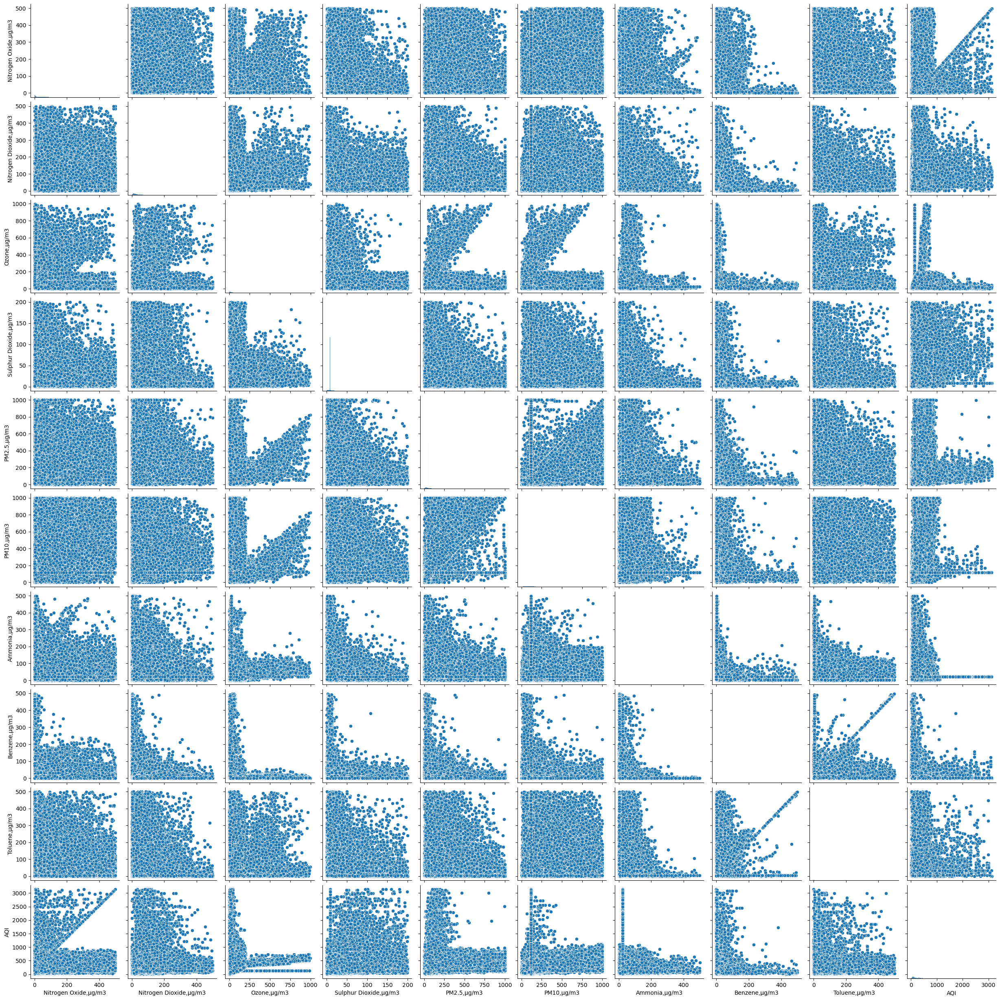

In [12]:
sns.pairplot(df.sample(n=1600000),hue = None,palette="cubehelix")
plt.show()

In [9]:
df['date'] = pd.to_datetime(df['Datetime'])
import datetime as dt
df['year'] = df['date'].dt.year
df['month']=df['date'].dt.month
df['week'] = df['date'].dt.weekday
df['Day_name'] = df['date'].dt.day_name()
df['hour'] = df['date'].apply(lambda x : int(x.hour))
df['day'] = df['date'].dt.day
df.head(5)

,Datetime,"Nitrogen Oxide,μg/m3","Nitrogen Dioxide,μg/m3","Ozone,μg/m3","Sulphur Dioxide,μg/m3","PM2.5,μg/m3","PM10,μg/m3","Ammonia,μg/m3","Benzene,μg/m3","Toluene,μg/m3",AQI,AQI_Bucket,date,year,month,week,Day_name,hour,day
0,2017-11-24 17:00:00,2.35,30.80,126.40,11.85,60.50,98.00,8.50,0.1,6.10,131.0,Moderate,2017-11-24 17:00:00,2017,11,4,Friday,17,24
1,2017-11-24 18:00:00,2.70,24.20,117.12,13.17,65.50,111.25,9.77,0.1,6.25,131.0,Moderate,2017-11-24 18:00:00,2017,11,4,Friday,18,24
2,2017-11-24 19:00:00,2.10,25.18,98.98,12.08,80.00,132.00,12.02,0.2,5.98,131.0,Moderate,2017-11-24 19:00:00,2017,11,4,Friday,19,24
3,2017-11-24 20:00:00,1.95,16.25,112.20,10.47,81.50,133.25,11.58,0.2,6.72,131.0,Moderate,2017-11-24 20:00:00,2017,11,4,Friday,20,24
4,2017-11-24 21:00:00,1.43,17.48,106.35,9.12,75.25,116.00,12.03,0.2,5.75,131.0,Moderate,2017-11-24 21:00:00,2017,11,4,Friday,21,24


In [10]:
df1= df.drop(['Datetime','date'],axis = 1)
df1.head(5)

,"Nitrogen Oxide,μg/m3","Nitrogen Dioxide,μg/m3","Ozone,μg/m3","Sulphur Dioxide,μg/m3","PM2.5,μg/m3","PM10,μg/m3","Ammonia,μg/m3","Benzene,μg/m3","Toluene,μg/m3",AQI,AQI_Bucket,year,month,week,Day_name,hour,day
0,2.35,30.80,126.40,11.85,60.50,98.00,8.50,0.1,6.10,131.0,Moderate,2017,11,4,Friday,17,24
1,2.70,24.20,117.12,13.17,65.50,111.25,9.77,0.1,6.25,131.0,Moderate,2017,11,4,Friday,18,24
2,2.10,25.18,98.98,12.08,80.00,132.00,12.02,0.2,5.98,131.0,Moderate,2017,11,4,Friday,19,24
3,1.95,16.25,112.20,10.47,81.50,133.25,11.58,0.2,6.72,131.0,Moderate,2017,11,4,Friday,20,24
4,1.43,17.48,106.35,9.12,75.25,116.00,12.03,0.2,5.75,131.0,Moderate,2017,11,4,Friday,21,24


In [15]:
seasons = { 1:'Winter', 2:'Winter', 3:'Summer', 4:'Summer', 5:'Summer',
           6:'Monsoon', 7:'Monsoon', 8:'Monsoon',9:'Monsoon', 10:'Autumn', 11:'Autumn',12:'Winter',}
df1['seasons']=df1['month'].map(seasons)
df1.sample(10)

,"Nitrogen Oxide,μg/m3","Nitrogen Dioxide,μg/m3","Ozone,μg/m3","Sulphur Dioxide,μg/m3","PM2.5,μg/m3","PM10,μg/m3","Ammonia,μg/m3","Benzene,μg/m3","Toluene,μg/m3",AQI,AQI_Bucket,year,month,week,Day_name,hour,day,seasons
412827,3.35,35.80,79.15,18.85,20.00,159.50,21.60,0.80,10.00,195.0,Moderate,2019,3,6,Sunday,19,31,Summer
2378442,6.67,82.70,24.76,12.93,89.09,116.25,22.35,0.04,7.13,247.0,Poor,2016,4,4,Friday,7,15,Summer
2163971,2.50,3.30,58.00,26.05,48.00,121.25,8.15,1.23,4.33,125.0,Moderate,2015,11,2,Wednesday,13,25,Autumn
2189075,4.55,45.20,52.15,3.65,71.00,160.00,25.15,2.40,11.10,124.0,Moderate,2018,10,5,Saturday,13,6,Autumn
1393580,3.49,16.64,11.14,6.94,13.49,116.25,22.35,1.80,3.51,40.0,Good,2020,6,3,Thursday,2,4,Monsoon
1374529,7.15,24.79,24.75,8.25,52.59,116.25,22.35,0.96,3.40,131.0,Moderate,2018,4,0,Monday,7,2,Summer
1099881,4.89,24.64,23.98,8.67,70.50,116.25,22.35,2.55,9.57,88.0,Satisfactory,2018,9,5,Saturday,12,15,Monsoon
719818,5.12,31.77,44.73,20.50,130.00,583.00,44.75,4.27,138.80,521.0,Severe,2018,12,2,Wednesday,16,5,Winter
774609,6.22,15.81,32.01,8.71,46.35,116.25,22.35,0.67,2.33,110.0,Moderate,2019,9,4,Friday,15,6,Monsoon
1692207,1.05,5.88,46.88,8.35,11.00,37.75,4.67,0.96,3.40,73.0,Satisfactory,2019,11,0,Monday,17,11,Autumn


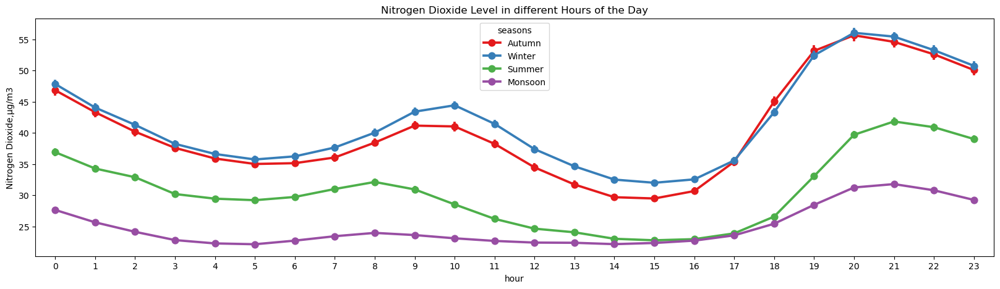

In [11]:
fig, ax= plt.subplots(figsize=(20,5))
sns.pointplot(data=df1, x="hour", y="Nitrogen Dioxide,μg/m3",hue="seasons",palette="Set1")
plt.xticks(np.arange(0, 24, 1))
plt.title("Nitrogen Dioxide Level in different Hours of the Day")
plt.show()

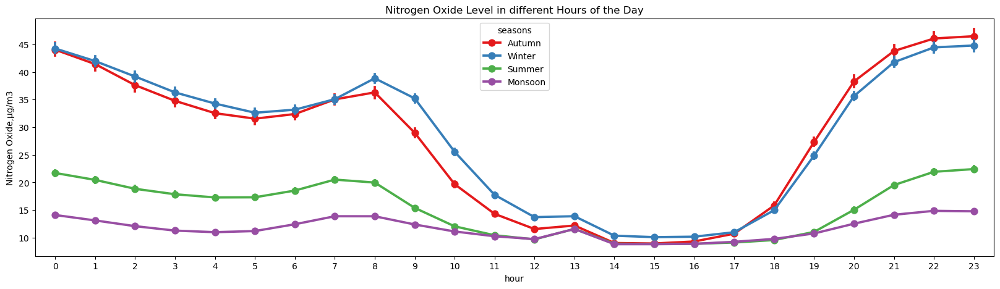

In [12]:
fig, ax= plt.subplots(figsize=(20,5))
sns.pointplot(data=df1, x="hour", y="Nitrogen Oxide,μg/m3",hue="seasons",palette="Set1")
plt.xticks(np.arange(0, 24, 1))
plt.title("Nitrogen Oxide Level in different Hours of the Day")
plt.show()

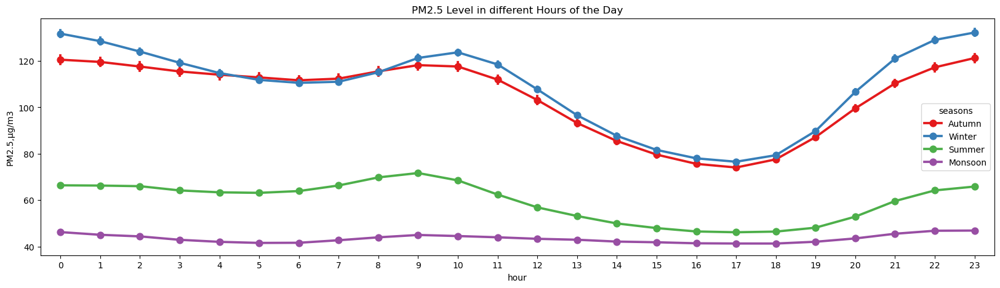

In [13]:
fig, ax= plt.subplots(figsize=(20,5))
sns.pointplot(data=df1, x="hour", y="PM2.5,μg/m3",hue="seasons",palette="Set1")
plt.xticks(np.arange(0, 24, 1))
plt.title("PM2.5 Level in different Hours of the Day")
plt.show()

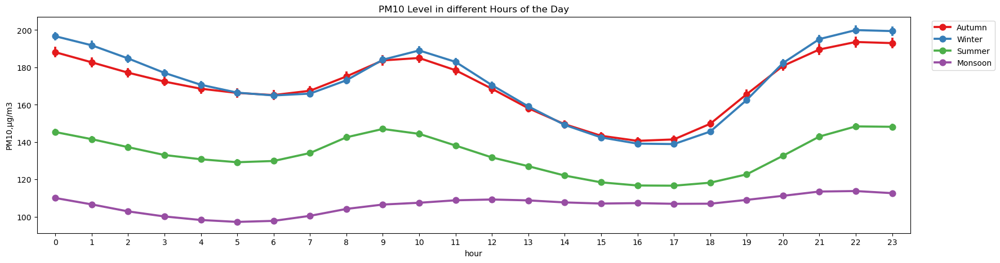

In [16]:
fig, ax= plt.subplots(figsize=(20,5))
sns.pointplot(data=df1, x="hour", y="PM10,μg/m3",hue="seasons",palette="Set1")
plt.xticks(np.arange(0, 24, 1))
plt.title("PM10 Level in different Hours of the Day")
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.show()

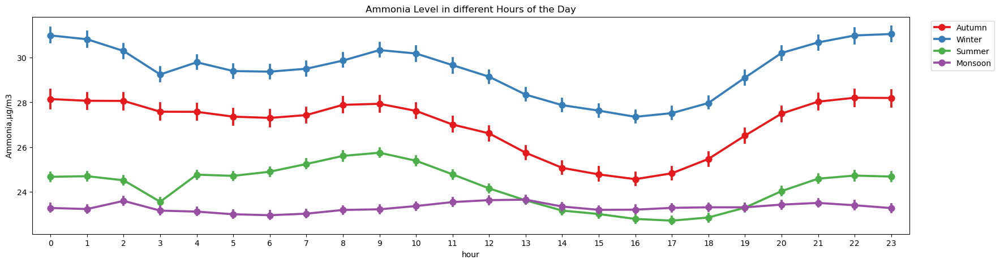

In [18]:
fig, ax= plt.subplots(figsize=(20,5))
sns.pointplot(data=df1, x="hour", y="Ammonia,μg/m3",hue="seasons",palette="Set1")
plt.xticks(np.arange(0, 24, 1))
plt.title("Ammonia Level in different Hours of the Day")
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.show()

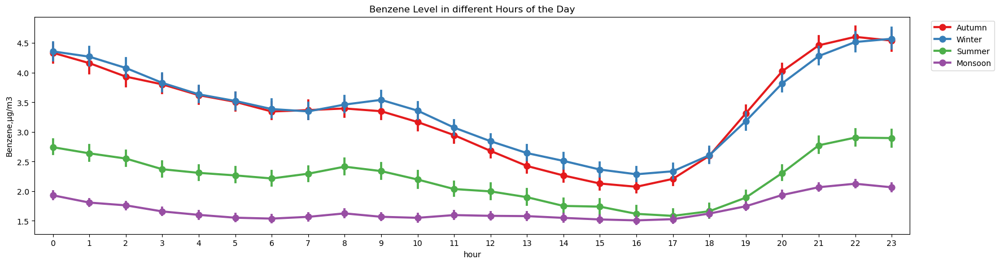

In [110]:
fig, ax= plt.subplots(figsize=(20,5))
sns.pointplot(data=df1, x="hour", y="Benzene,μg/m3",hue="seasons",palette="Set1")
plt.xticks(np.arange(0, 24, 1))
plt.title("Benzene Level in different Hours of the Day")
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.show()

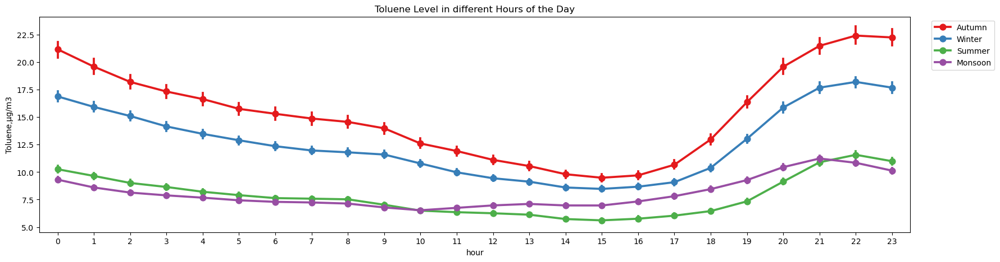

In [111]:
fig, ax= plt.subplots(figsize=(20,5))
sns.pointplot(data=df1, x="hour", y="Toluene,μg/m3",hue="seasons",palette="Set1")
plt.xticks(np.arange(0, 24, 1))
plt.title("Toluene Level in different Hours of the Day")
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.show()

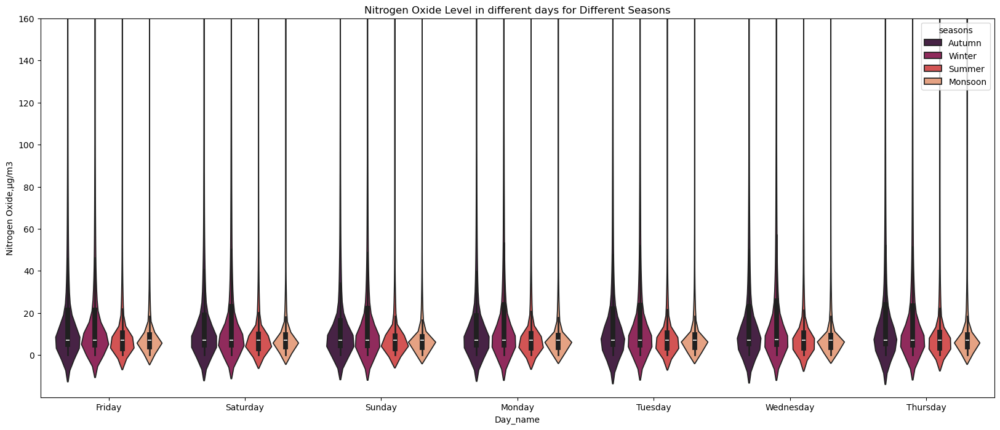

In [60]:
fig, ax= plt.subplots(figsize=(20,8))
sns.violinplot(data=df_filtered, x="Day_name", y="Nitrogen Oxide,μg/m3", hue="seasons",palette="rocket")
plt.title("Nitrogen Oxide Level in different days for Different Seasons")
plt.ylim(-20,150)
yticks = ax.get_yticks()
ax.set_yticks(yticks[yticks >= 0])
plt.show()

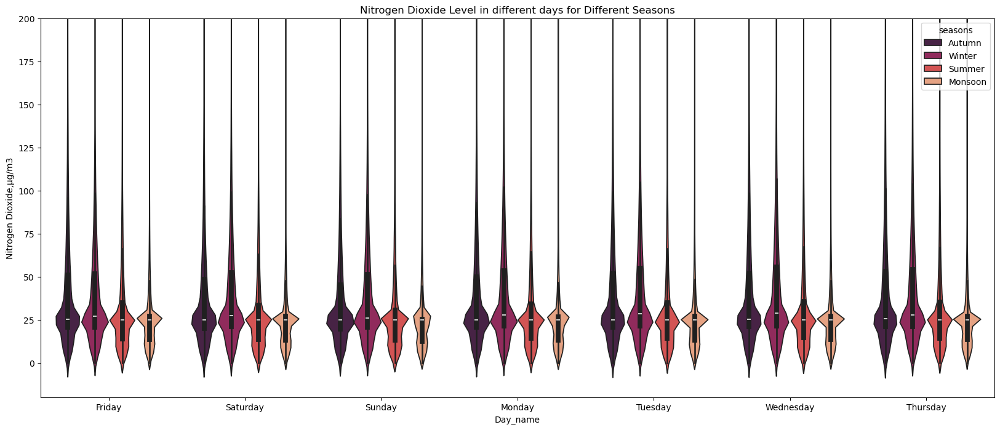

In [40]:
fig, ax= plt.subplots(figsize=(20,8))
sns.violinplot(data=df1, x="Day_name", y="Nitrogen Dioxide,μg/m3", hue="seasons",palette="rocket")
plt.ylim(-20,200)
plt.title("Nitrogen Dioxide Level in different days for Different Seasons")
plt.show()

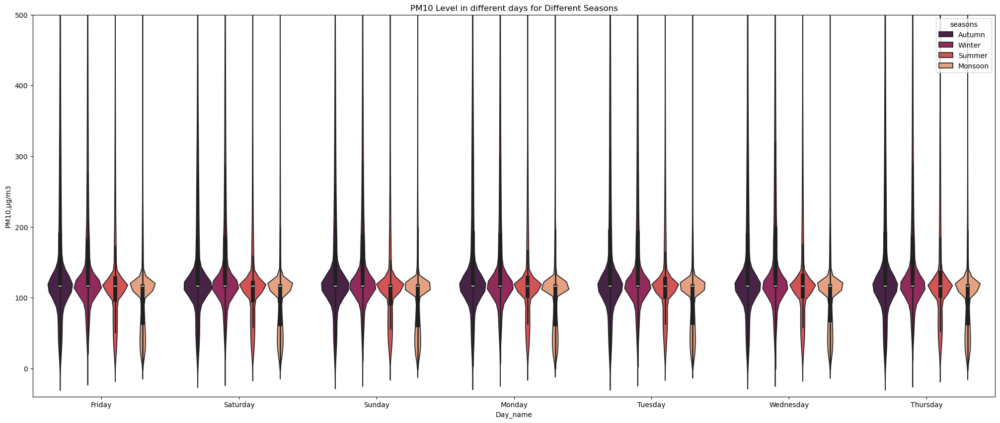

In [49]:
fig, ax= plt.subplots(figsize=(25,10))
sns.violinplot(data=df1, x="Day_name", y="PM10,μg/m3", hue="seasons",palette="rocket")
plt.ylim(-40,500)
plt.title("PM10 Level in different days for Different Seasons")
plt.show()

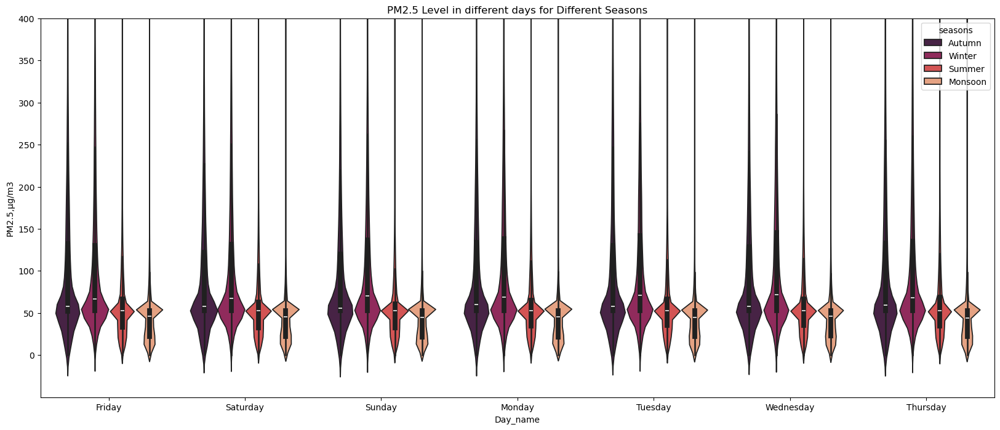

In [59]:
fig, ax= plt.subplots(figsize=(20,8))
sns.violinplot(data=df1, x="Day_name", y="PM2.5,μg/m3", hue="seasons",palette="rocket")
plt.title("PM2.5 Level in different days for Different Seasons")
plt.ylim(-50,400)
yticks = ax.get_yticks()
ax.set_yticks(yticks[yticks >= 0])
plt.show()

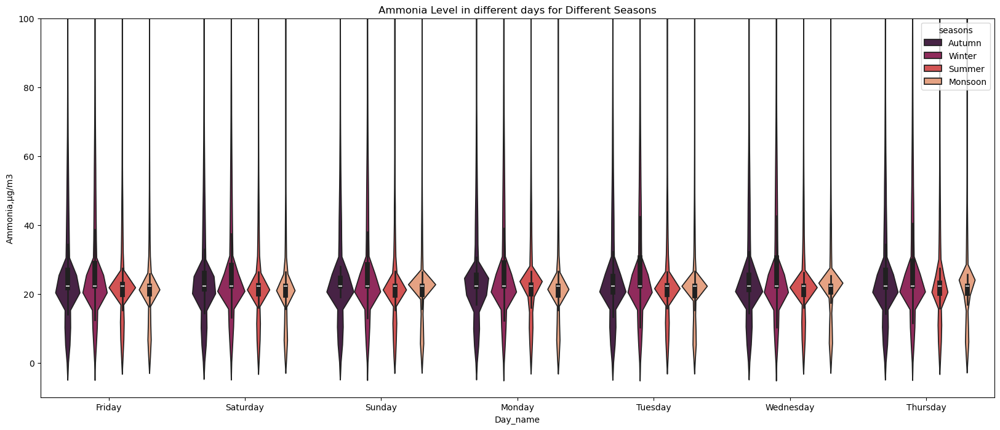

In [58]:
fig, ax= plt.subplots(figsize=(20,8))
sns.violinplot(data=df1, x="Day_name", y="Ammonia,μg/m3", hue="seasons",palette="rocket")
plt.title("Ammonia Level in different days for Different Seasons")
plt.ylim(-10,100)
yticks = ax.get_yticks()
ax.set_yticks(yticks[yticks >= 0])
plt.show()

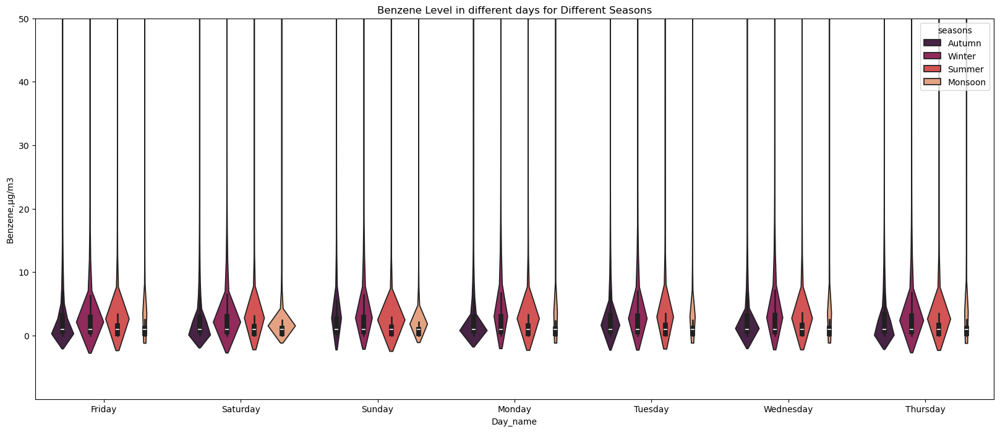

In [114]:
fig, ax= plt.subplots(figsize=(20,8))
sns.violinplot(data=df1, x="Day_name", y="Benzene,μg/m3", hue="seasons",palette="rocket")
plt.title("Benzene Level in different days for Different Seasons")
plt.ylim(-10,50)
yticks = ax.get_yticks()
ax.set_yticks(yticks[yticks >= 0])
plt.show()

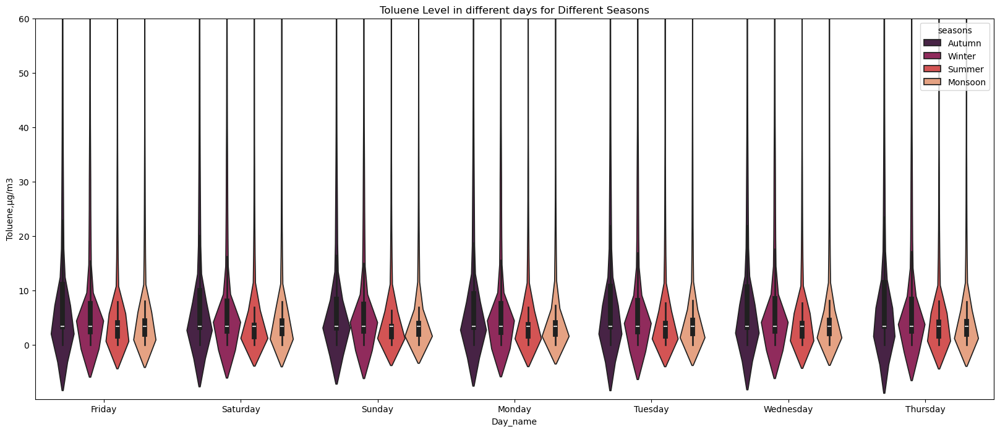

In [117]:
fig, ax= plt.subplots(figsize=(20,8))
sns.violinplot(data=df1, x="Day_name", y="Toluene,μg/m3", hue="seasons",palette="rocket")
plt.title("Toluene Level in different days for Different Seasons")
plt.ylim(-10,60)
yticks = ax.get_yticks()
ax.set_yticks(yticks[yticks >= 0])
plt.show()

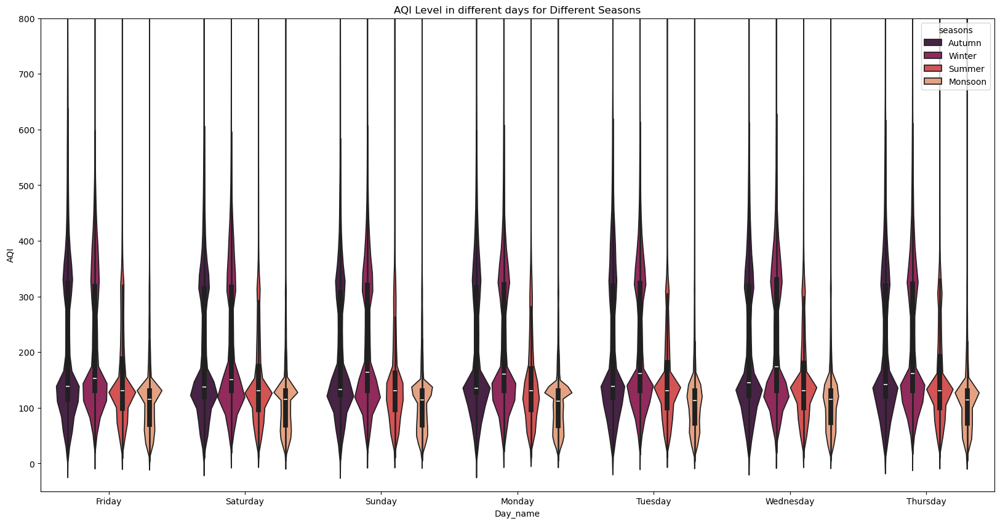

In [16]:
fig, ax= plt.subplots(figsize=(20,10))
sns.violinplot(data=df1, x="Day_name", y="AQI", hue="seasons",palette="rocket")
plt.title("AQI Level in different days for Different Seasons")
plt.ylim(-50,800)
yticks = ax.get_yticks()
ax.set_yticks(yticks[yticks >= 0])
plt.show()

In [37]:
df1.head(5)

,"Nitrogen Oxide,μg/m3","Nitrogen Dioxide,μg/m3","Ozone,μg/m3","Sulphur Dioxide,μg/m3","PM2.5,μg/m3","PM10,μg/m3","Ammonia,μg/m3","Benzene,μg/m3","Toluene,μg/m3",AQI,AQI_Bucket,year,month,week,Day_name,hour,day,seasons
0,2.35,30.80,126.40,11.85,60.50,98.00,8.50,0.1,6.10,131.0,Moderate,2017,11,4,Friday,17,24,Autumn
1,2.70,24.20,117.12,13.17,65.50,111.25,9.77,0.1,6.25,131.0,Moderate,2017,11,4,Friday,18,24,Autumn
2,2.10,25.18,98.98,12.08,80.00,132.00,12.02,0.2,5.98,131.0,Moderate,2017,11,4,Friday,19,24,Autumn
3,1.95,16.25,112.20,10.47,81.50,133.25,11.58,0.2,6.72,131.0,Moderate,2017,11,4,Friday,20,24,Autumn
4,1.43,17.48,106.35,9.12,75.25,116.00,12.03,0.2,5.75,131.0,Moderate,2017,11,4,Friday,21,24,Autumn


In [11]:
df1['date'] = pd.to_datetime(df['Datetime']).dt.date
df1['time'] = pd.to_datetime(df['Datetime']).dt.time

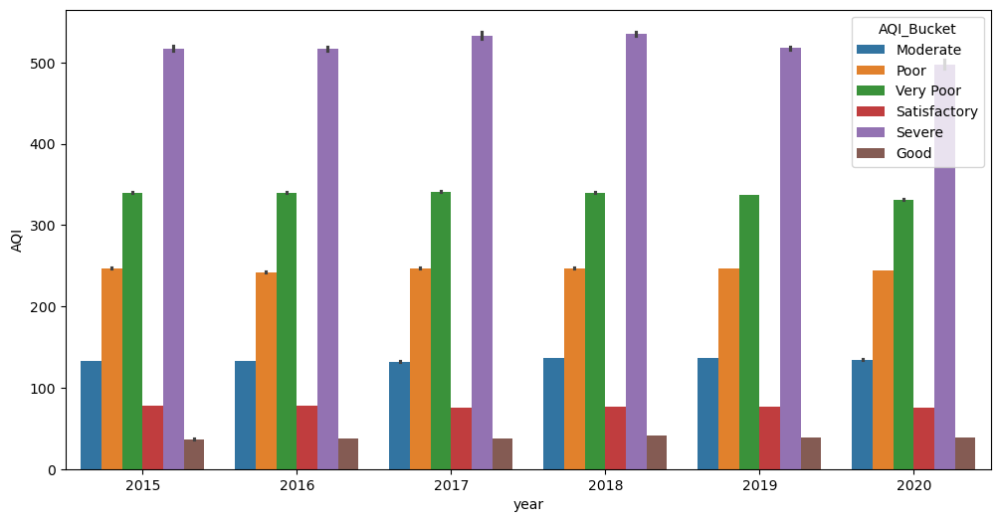

In [123]:
fig, ax= plt.subplots(figsize=(12,6))
sns.barplot(data=df1, x="year", y="AQI",hue ='AQI_Bucket')
plt.show()

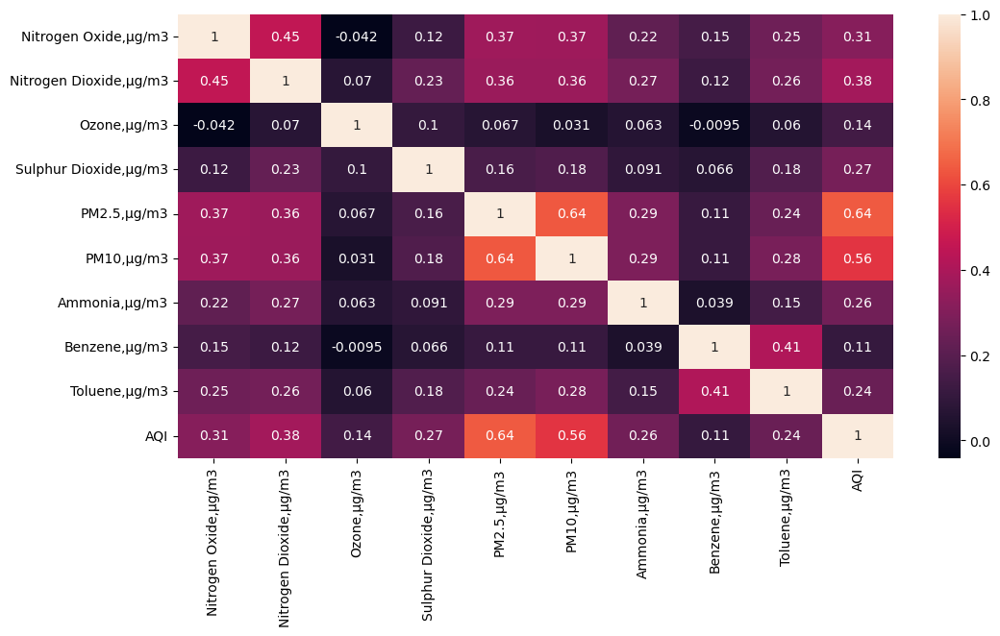

In [12]:
df2 = df1.iloc[:,0:10]
corr_matrix = df2.corr()
fig, ax= plt.subplots(figsize=(12,6))
sns.heatmap(corr_matrix, annot=True)
plt.show()

In [13]:
df2 = df1.iloc[:,0:11]

In [19]:
df2.head(5)

,"Nitrogen Oxide,μg/m3","Nitrogen Dioxide,μg/m3","Ozone,μg/m3","Sulphur Dioxide,μg/m3","PM2.5,μg/m3","PM10,μg/m3","Ammonia,μg/m3","Benzene,μg/m3","Toluene,μg/m3",AQI,AQI_Bucket
0,2.35,30.80,126.40,11.85,60.50,98.00,8.50,0.1,6.10,131.0,Moderate
1,2.70,24.20,117.12,13.17,65.50,111.25,9.77,0.1,6.25,131.0,Moderate
2,2.10,25.18,98.98,12.08,80.00,132.00,12.02,0.2,5.98,131.0,Moderate
3,1.95,16.25,112.20,10.47,81.50,133.25,11.58,0.2,6.72,131.0,Moderate
4,1.43,17.48,106.35,9.12,75.25,116.00,12.03,0.2,5.75,131.0,Moderate


<Figure size 1000x1000 with 0 Axes>

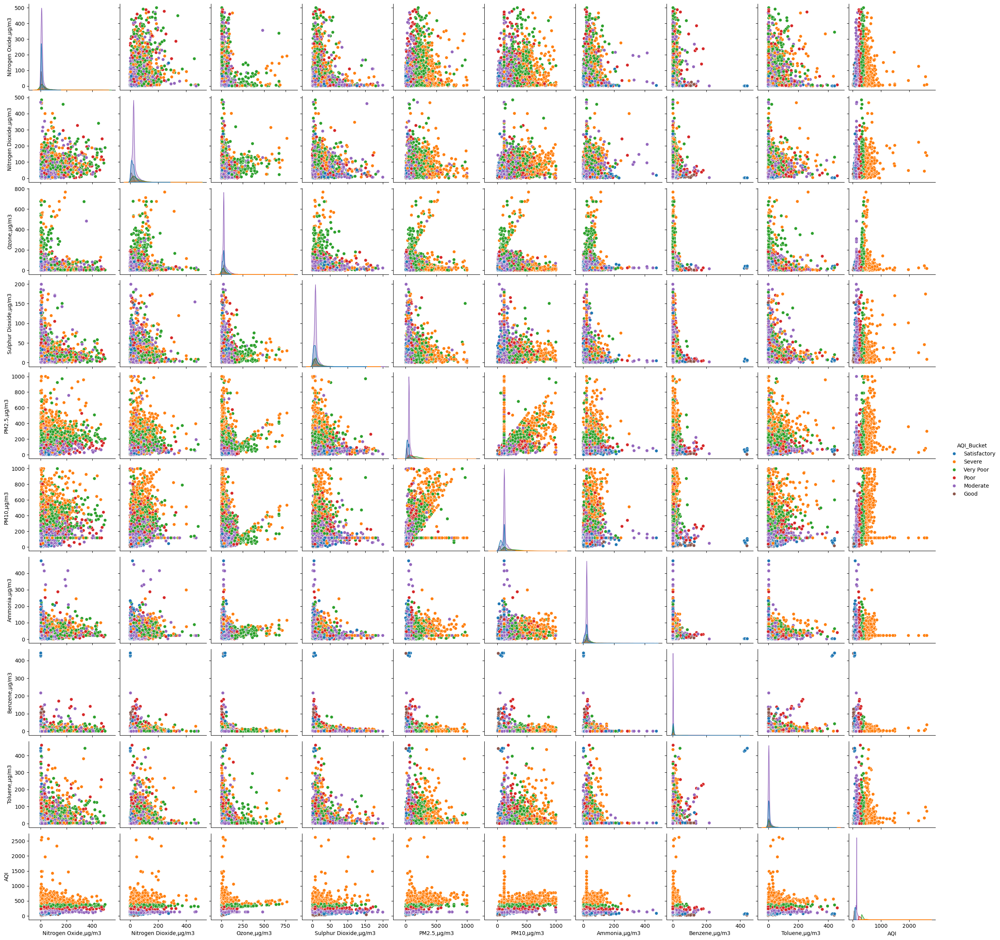

In [14]:
plt.figure(figsize=(10,10))
sns.pairplot(df2.sample(n=16000),hue = 'AQI_Bucket')
plt.show()

In [15]:
df1.sample(5)

,"Nitrogen Oxide,μg/m3","Nitrogen Dioxide,μg/m3","Ozone,μg/m3","Sulphur Dioxide,μg/m3","PM2.5,μg/m3","PM10,μg/m3","Ammonia,μg/m3","Benzene,μg/m3","Toluene,μg/m3",AQI,AQI_Bucket,year,month,week,Day_name,hour,day,date,time
849387,1.49,11.35,18.31,8.25,80.79,116.25,22.35,2.05,7.53,245.0,Poor,2018,2,3,Thursday,15,22,2018-02-22,15:00:00
411581,24.43,33.42,3.33,18.45,39.50,76.75,34.25,3.20,28.52,133.0,Moderate,2019,2,3,Thursday,21,7,2019-02-07,21:00:00
1634482,4.71,13.13,24.75,2.25,52.59,44.85,22.35,0.96,3.40,30.0,Good,2019,7,2,Wednesday,15,31,2019-07-31,15:00:00
2112198,19.13,33.75,12.65,4.35,16.50,32.00,7.17,0.90,11.90,49.0,Good,2020,4,3,Thursday,4,23,2020-04-23,04:00:00
996667,3.58,5.63,9.35,8.25,32.43,97.66,22.35,0.00,0.68,106.0,Moderate,2020,1,4,Friday,2,31,2020-01-31,02:00:00
